In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import metrics, preprocessing
from sklearn.ensemble import RandomForestClassifier

In [2]:
tc=pd.read_csv(r'telecom_churn_data_original.csv')

Drops coolumns which have zero vairance

In [4]:
t=tc.var()==0
tc.drop(list(t[t==1].index),axis=1,inplace=True)


In [5]:
tu=tc.nunique()

In [6]:
tc.drop(list(tu[tu==1].index),axis=1,inplace=True)

# Imputing 0 , for missing values for total_rech_data_*,av_rech_amt_data_*
# secod if total_rech_data=0 then we can impute 0 for night_pck_user_* & fb_user_* 

In [8]:
tc.loc[((tc.total_rech_data_6.isnull()) & (tc.av_rech_amt_data_6.isnull()) & (tc.vol_2g_mb_6==0) & (tc.vol_3g_mb_6==0)),'total_rech_data_6']=0
tc.loc[((tc.total_rech_data_6==0) & (tc.av_rech_amt_data_6.isnull()) & (tc.vol_2g_mb_6==0) & (tc.vol_3g_mb_6==0)),'av_rech_amt_data_6']=0


In [9]:
tc.loc[((tc.total_rech_data_7.isnull()) & (tc.av_rech_amt_data_7.isnull()) & (tc.vol_2g_mb_7==0) & (tc.vol_3g_mb_7==0)),'total_rech_data_7']=0
tc.loc[((tc.total_rech_data_7==0) & (tc.av_rech_amt_data_7.isnull()) & (tc.vol_2g_mb_7==0) & (tc.vol_3g_mb_7==0)),'av_rech_amt_data_7']=0

In [10]:
tc.loc[((tc.total_rech_data_8.isnull()) & (tc.av_rech_amt_data_8.isnull()) & (tc.vol_2g_mb_8==0) & (tc.vol_3g_mb_8==0)),'total_rech_data_8']=0
tc.loc[((tc.total_rech_data_8==0) & (tc.av_rech_amt_data_8.isnull()) & (tc.vol_2g_mb_8==0) & (tc.vol_3g_mb_8==0)),'av_rech_amt_data_8']=0

In [11]:
tc.loc[((tc.total_rech_data_9.isnull()) & (tc.av_rech_amt_data_9.isnull()) & (tc.vol_2g_mb_9==0) & (tc.vol_3g_mb_9==0)),'total_rech_data_9']=0
tc.loc[((tc.total_rech_data_9==0) & (tc.av_rech_amt_data_9.isnull()) & (tc.vol_2g_mb_9==0) & (tc.vol_3g_mb_9==0)),'av_rech_amt_data_9']=0

In [12]:
tc.loc[((tc.total_rech_data_6==0) & (tc.av_rech_amt_data_6==0) & (tc.vol_2g_mb_6==0) & (tc.vol_3g_mb_6==0) & (tc.night_pck_user_6.isnull())),'night_pck_user_6']=0
tc.loc[((tc.total_rech_data_6==0) & (tc.av_rech_amt_data_6==0) & (tc.vol_2g_mb_6==0) & (tc.vol_3g_mb_6==0) & (tc.fb_user_6.isnull())),'fb_user_6']=0

In [13]:
tc.loc[((tc.total_rech_data_7==0) & (tc.av_rech_amt_data_7==0) & (tc.vol_2g_mb_7==0) & (tc.vol_3g_mb_7==0) & (tc.night_pck_user_7.isnull())),'night_pck_user_7']=0
tc.loc[((tc.total_rech_data_7==0) & (tc.av_rech_amt_data_7==0) & (tc.vol_2g_mb_7==0) & (tc.vol_3g_mb_7==0) & (tc.fb_user_7.isnull())),'fb_user_7']=0

In [14]:
tc.loc[((tc.total_rech_data_8==0) & (tc.av_rech_amt_data_8==0) & (tc.vol_2g_mb_8==0) & (tc.vol_3g_mb_8==0) & (tc.night_pck_user_8.isnull())),'night_pck_user_8']=0
tc.loc[((tc.total_rech_data_8==0) & (tc.av_rech_amt_data_8==0) & (tc.vol_2g_mb_8==0) & (tc.vol_3g_mb_8==0) & (tc.fb_user_8.isnull())),'fb_user_8']=0

In [15]:
tc.loc[((tc.total_rech_data_9==0) & (tc.av_rech_amt_data_9==0) & (tc.vol_2g_mb_9==0) & (tc.vol_3g_mb_9==0) & (tc.night_pck_user_9.isnull())),'night_pck_user_9']=0
tc.loc[((tc.total_rech_data_9==0) & (tc.av_rech_amt_data_9==0) & (tc.vol_2g_mb_9==0) & (tc.vol_3g_mb_9==0) & (tc.fb_user_9.isnull())),'fb_user_9']=0

total recharge done by customer is recharge for Voice+recharge for Data


In [16]:
tc['total_rech_vocie_data_6']=tc['total_rech_amt_6']+(tc['total_rech_data_6'] * tc['av_rech_amt_data_6'])
tc['total_rech_vocie_data_7']=tc['total_rech_amt_7']+(tc['total_rech_data_7'] * tc['av_rech_amt_data_7'])
tc['total_rech_vocie_data_8']=tc['total_rech_amt_8']+(tc['total_rech_data_8'] * tc['av_rech_amt_data_8'])
tc['total_rech_vocie_data_9']=tc['total_rech_amt_9']+(tc['total_rech_data_9'] * tc['av_rech_amt_data_9'])

In [17]:
tc['average_rech_6_7']=round((tc['total_rech_vocie_data_6']+tc['total_rech_vocie_data_7'])/2,2)

In [18]:
tc.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_vocie_data_6,total_rech_vocie_data_7,total_rech_vocie_data_8,total_rech_vocie_data_9,average_rech_6_7
0,7000842753,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,0.0,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,

In [19]:
#find 70th percentile
t=np.percentile(tc.average_rech_6_7, 70.0)

In [20]:
t

478.0

In [21]:
tc_hvc=tc[tc.average_rech_6_7>t]

In [22]:
tc_hvc

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_vocie_data_6,total_rech_vocie_data_7,total_rech_vocie_data_8,total_rech_vocie_data_9,average_rech_6_7
0,7000842753,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,0.0,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.00,252.0,252.0,0.0,30.13,1.32,5.75,0.00,83.57,150.76,1

Tag customer are Chrun=1 and non_chrun=0

In [23]:
tc_hvc[['total_og_mou_9','total_ic_mou_9','vol_2g_mb_9','vol_3g_mb_9']].isnull().sum()

total_og_mou_9    0
total_ic_mou_9    0
vol_2g_mb_9       0
vol_3g_mb_9       0
dtype: int64

In [24]:
tc_hvc.loc[((tc_hvc.total_og_mou_9==0) & (tc_hvc.total_ic_mou_9==0) & (tc_hvc.vol_2g_mb_9==0) & (tc_hvc.vol_3g_mb_9==0)),'churn']=1

C:\Users\A583452\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\A583452\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [25]:
tc_hvc.loc[tc_hvc.churn.isnull(),'churn']=0

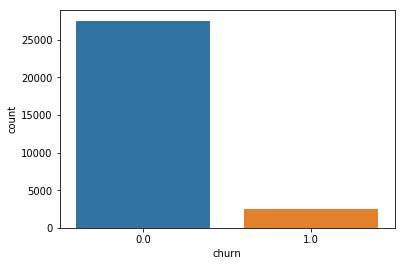

In [26]:
sns.countplot(x="churn",data=tc_hvc)

In [27]:
#its clear from the above chart, that there exist a class imbalance, we need to take care of the same while modelling

In [27]:
#tc_hvc.describe()
#remove all columns that belong to the churn stage i.e. *_9
tc_hvc.drop(tc_hvc.columns[tc_hvc.columns.str.endswith('9')],axis=1,inplace=True)
tc_hvc.drop('sep_vbc_3g',axis=1,inplace=True)

C:\Users\A583452\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


In [28]:
tc_hvc

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_vocie_data_6,total_rech_vocie_data_7,total_rech_vocie_data_8,average_rech_6_7,churn
0,7000842753,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,4.13,NaN,NaN,1.15,NaN,NaN,5.44,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,0.00,0.00,5.44,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,4,3,2,362,252,252,252,252,252,6/21/2014,7/16/2014,8/8/2014,252,252,252,6/21/2014,7/16/2014,8/8/2014,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.00,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,968,30.40,0.00,101.20,614.00,504.0,504.0,559.00,1.0
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.00,0.00,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.00,0.18,10.01,4.50,0.00,6.50,0.00,0.00,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.00,0.00,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,

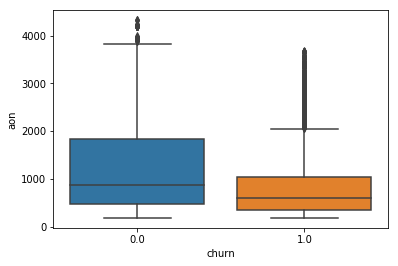

In [47]:
sns.boxplot(x="churn",y="aon",data=tc_hvc)

In [84]:
#sns.distplot(tc_hvc.std_og_mou_6)
tc_hvc.columns[(tc_hvc.isnull().sum()/len(tc_hvc.index))*100 >1]

Index([], dtype='object')

In [43]:
#impute arpu_3g_*=0 if the data recharge =0
tc_hvc.loc[((tc_hvc.arpu_3g_6.isnull()) & (tc_hvc.av_rech_amt_data_6==0) & (tc.vol_3g_mb_6==0)),'arpu_3g_6']=0
tc_hvc.loc[((tc_hvc.arpu_2g_6.isnull()) & (tc_hvc.av_rech_amt_data_6==0) & (tc.vol_2g_mb_6==0)),'arpu_2g_6']=0

In [46]:
tc_hvc.loc[((tc_hvc.arpu_3g_7.isnull()) & (tc_hvc.av_rech_amt_data_7==0) & (tc.vol_3g_mb_7==0)),'arpu_3g_7']=0
tc_hvc.loc[((tc_hvc.arpu_2g_7.isnull()) & (tc_hvc.av_rech_amt_data_7==0) & (tc.vol_2g_mb_7==0)),'arpu_2g_7']=0
tc_hvc.loc[((tc_hvc.arpu_3g_8.isnull()) & (tc_hvc.av_rech_amt_data_8==0) & (tc.vol_3g_mb_8==0)),'arpu_3g_8']=0
tc_hvc.loc[((tc_hvc.arpu_2g_8.isnull()) & (tc_hvc.av_rech_amt_data_8==0) & (tc.vol_2g_mb_8==0)),'arpu_2g_8']=0

In [51]:
tc_hvc['onnet_mou_6'].fillna(0,inplace=True)

C:\Users\A583452\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\generic.py:6130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)


In [53]:
tc_hvc['offnet_mou_6'].fillna(0,inplace=True)
tc_hvc['onnet_mou_7'].fillna(0,inplace=True)
tc_hvc['offnet_mou_7'].fillna(0,inplace=True)


In [54]:
tc_hvc['onnet_mou_8'].fillna(0,inplace=True)
tc_hvc['offnet_mou_8'].fillna(0,inplace=True)




In [57]:
tc_hvc['count_rech_2g_6'].fillna(0,inplace=True)
tc_hvc['count_rech_2g_7'].fillna(0,inplace=True)
tc_hvc['count_rech_2g_8'].fillna(0,inplace=True)
tc_hvc['count_rech_3g_6'].fillna(0,inplace=True)
tc_hvc['count_rech_3g_7'].fillna(0,inplace=True)
tc_hvc['count_rech_3g_8'].fillna(0,inplace=True)
tc_hvc['max_rech_data_6'].fillna(0,inplace=True)
tc_hvc['max_rech_data_7'].fillna(0,inplace=True)
tc_hvc['max_rech_data_8'].fillna(0,inplace=True)

In [60]:
tc_hvc.drop(['date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8'],axis=1,inplace=True)

KeyError: "['date_of_last_rech_data_6' 'date_of_last_rech_data_7'\n 'date_of_last_rech_data_8'] not found in axis"

In [77]:

tc_hvc[['spl_ic_mou_6','spl_ic_mou_7','spl_ic_mou_8']].fillna(0,inplace=True)
tc_hvc[['ic_others_6','ic_others_7','ic_others_8']].fillna(0,inplace=True)
tc_hvc[['std_ic_mou_6','std_ic_mou_6','std_ic_mou_6']].fillna(0,inplace=True)

In [81]:
lst=list(tc_hvc.columns[tc_hvc.isnull().sum()>0])

In [83]:
for i in lst:
    tc_hvc.fillna(0,inplace=True)


In [85]:
tc_hvc.isnull().sum()

mobile_number              0
arpu_6                     0
arpu_7                     0
arpu_8                     0
onnet_mou_6                0
onnet_mou_7                0
onnet_mou_8                0
offnet_mou_6               0
offnet_mou_7               0
offnet_mou_8               0
roam_ic_mou_6              0
roam_ic_mou_7              0
roam_ic_mou_8              0
roam_og_mou_6              0
roam_og_mou_7              0
roam_og_mou_8              0
loc_og_t2t_mou_6           0
loc_og_t2t_mou_7           0
loc_og_t2t_mou_8           0
loc_og_t2m_mou_6           0
loc_og_t2m_mou_7           0
loc_og_t2m_mou_8           0
loc_og_t2f_mou_6           0
loc_og_t2f_mou_7           0
loc_og_t2f_mou_8           0
loc_og_t2c_mou_6           0
loc_og_t2c_mou_7           0
loc_og_t2c_mou_8           0
loc_og_mou_6               0
loc_og_mou_7               0
loc_og_mou_8               0
std_og_t2t_mou_6           0
std_og_t2t_mou_7           0
std_og_t2t_mou_8           0
std_og_t2m_mou

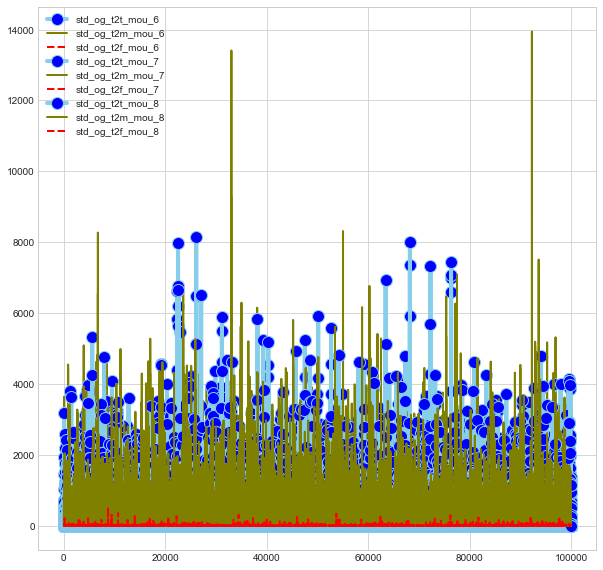

In [172]:
plt.figure(figsize = (10,10))
#plt.style.use('seaborn-whitegrid')
plt.plot( 'std_og_t2t_mou_6', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'std_og_t2m_mou_6', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'std_og_t2f_mou_6', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.legend()
plt.plot( 'std_og_t2t_mou_7', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'std_og_t2m_mou_7', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'std_og_t2f_mou_7', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.legend()
plt.plot( 'std_og_t2t_mou_8', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'std_og_t2m_mou_8', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'std_og_t2f_mou_8', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.legend()


In [176]:
tc_hvc[['std_og_mou_6','std_og_t2t_mou_6','std_og_t2m_mou_6','std_og_t2f_mou_6']].corr()

,std_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6
std_og_mou_6,1.000000,0.744727,0.752689,0.001931
std_og_t2t_mou_6,0.744727,1.000000,0.121603,-0.026816
std_og_t2m_mou_6,0.752689,0.121603,1.000000,0.000048
std_og_t2f_mou_6,0.001931,-0.026816,0.000048,1.000000


In [177]:
tc_hvc[['std_og_mou_7','std_og_t2t_mou_7','std_og_t2m_mou_7','std_og_t2f_mou_7']].corr()

,std_og_mou_7,std_og_t2t_mou_7,std_og_t2m_mou_7,std_og_t2f_mou_7
std_og_mou_7,1.000000,0.739494,0.756998,0.004663
std_og_t2t_mou_7,0.739494,1.000000,0.120401,-0.025483
std_og_t2m_mou_7,0.756998,0.120401,1.000000,0.001692
std_og_t2f_mou_7,0.004663,-0.025483,0.001692,1.000000


In [178]:
tc_hvc[['std_og_mou_8','std_og_t2t_mou_8','std_og_t2m_mou_8','std_og_t2f_mou_8']].corr()

,std_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8
std_og_mou_8,1.000000,0.746629,0.762876,0.002459
std_og_t2t_mou_8,0.746629,1.000000,0.139846,-0.023979
std_og_t2m_mou_8,0.762876,0.139846,1.000000,0.000237
std_og_t2f_mou_8,0.002459,-0.023979,0.000237,1.000000


#from the above graph and correlation matrix, it seems that std_og_t2f is not so significant, as compared to other features, hence droping std_og_t2f_*

In [179]:
tc_hvc.drop(['std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8'],axis=1,inplace=True)

C:\Users\A583452\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


In [210]:
tc_hvc.drop(['std_og_mou_6','std_og_mou_7','std_og_mou_8'],axis=1,inplace=True)

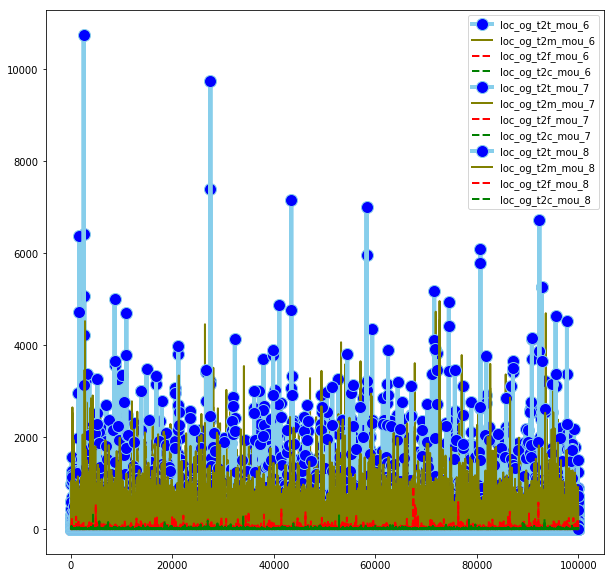

In [116]:
plt.figure(figsize = (10,10))
plt.plot( 'loc_og_t2t_mou_6', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'loc_og_t2m_mou_6', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'loc_og_t2f_mou_6', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.plot( 'loc_og_t2c_mou_6', data=tc_hvc, marker='', color='green', linewidth=2, linestyle='dashed')
plt.legend()
plt.plot( 'loc_og_t2t_mou_7', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'loc_og_t2m_mou_7', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'loc_og_t2f_mou_7', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.plot( 'loc_og_t2c_mou_7', data=tc_hvc, marker='', color='green', linewidth=2, linestyle='dashed')
plt.legend()
plt.plot( 'loc_og_t2t_mou_8', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'loc_og_t2m_mou_8', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'loc_og_t2f_mou_8', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.plot( 'loc_og_t2c_mou_8', data=tc_hvc, marker='', color='green', linewidth=2, linestyle='dashed')
plt.legend()

In [181]:
tc_hvc[['loc_og_mou_6','loc_og_t2t_mou_6','loc_og_t2m_mou_6','loc_og_t2f_mou_6','loc_og_t2c_mou_6']].corr()

,loc_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6
loc_og_mou_6,1.000000,0.753428,0.804524,0.213668,0.029722
loc_og_t2t_mou_6,0.753428,1.000000,0.219681,0.057605,0.030528
loc_og_t2m_mou_6,0.804524,0.219681,1.000000,0.182051,0.017312
loc_og_t2f_mou_6,0.213668,0.057605,0.182051,1.000000,-0.003183
loc_og_t2c_mou_6,0.029722,0.030528,0.017312,-0.003183,1.000000


In [182]:
tc_hvc[['loc_og_mou_7','loc_og_t2t_mou_7','loc_og_t2m_mou_7','loc_og_t2f_mou_7','loc_og_t2c_mou_7']].corr()

,loc_og_mou_7,loc_og_t2t_mou_7,loc_og_t2m_mou_7,loc_og_t2f_mou_7,loc_og_t2c_mou_7
loc_og_mou_7,1.000000,0.763770,0.774069,0.213828,0.004958
loc_og_t2t_mou_7,0.763770,1.000000,0.186459,0.050942,0.004764
loc_og_t2m_mou_7,0.774069,0.186459,1.000000,0.190733,0.003282
loc_og_t2f_mou_7,0.213828,0.050942,0.190733,1.000000,-0.003528
loc_og_t2c_mou_7,0.004958,0.004764,0.003282,-0.003528,1.000000


In [183]:
tc_hvc[['loc_og_mou_8','loc_og_t2t_mou_8','loc_og_t2m_mou_8','loc_og_t2f_mou_8','loc_og_t2c_mou_8']].corr()

,loc_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8
loc_og_mou_8,1.000000,0.767397,0.788642,0.235265,0.022466
loc_og_t2t_mou_8,0.767397,1.000000,0.214313,0.069173,0.019621
loc_og_t2m_mou_8,0.788642,0.214313,1.000000,0.215074,0.016205
loc_og_t2f_mou_8,0.235265,0.069173,0.215074,1.000000,-0.004357
loc_og_t2c_mou_8,0.022466,0.019621,0.016205,-0.004357,1.000000


# from the above graph & correlation matirx, its clear that loc_og_t2f_* and loc_og_t2c_* are not so signnificant as comapared to other features, hence dropping these 2 features.

In [184]:
tc_hvc.drop(['loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8','loc_og_t2c_mou_6','loc_og_t2c_mou_7',
            'loc_og_t2c_mou_8'],axis=1,inplace=True)

In [211]:
tc_hvc.drop(['loc_og_mou_6','loc_og_mou_7','loc_og_mou_8'],axis=1,inplace=True)

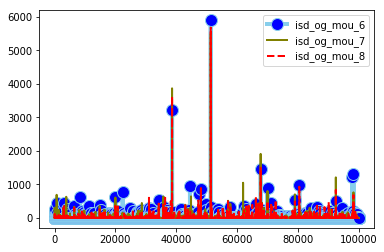

In [118]:
plt.plot( 'isd_og_mou_6', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'isd_og_mou_7', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'isd_og_mou_8', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.legend()

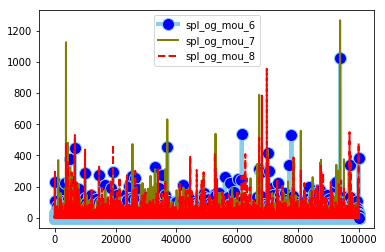

In [119]:
plt.plot( 'spl_og_mou_6', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'spl_og_mou_7', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'spl_og_mou_8', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.legend()

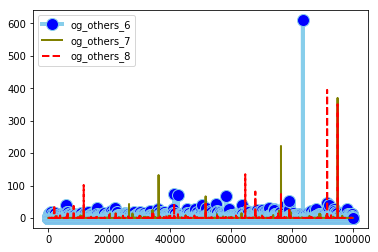

In [120]:
plt.plot( 'og_others_6', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'og_others_7', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'og_others_8', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.legend()

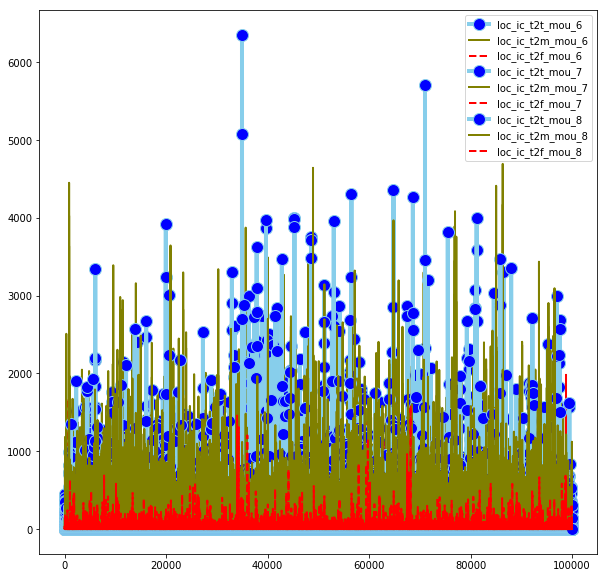

In [117]:
plt.figure(figsize = (10,10))
plt.plot( 'loc_ic_t2t_mou_6', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'loc_ic_t2m_mou_6', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'loc_ic_t2f_mou_6', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.legend()
plt.plot( 'loc_ic_t2t_mou_7', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'loc_ic_t2m_mou_7', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'loc_ic_t2f_mou_7', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.legend()
plt.plot( 'loc_ic_t2t_mou_8', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'loc_ic_t2m_mou_8', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'loc_ic_t2f_mou_8', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.legend()

In [186]:
tc_hvc[['loc_ic_mou_6','loc_ic_t2t_mou_6','loc_ic_t2m_mou_6','loc_ic_t2f_mou_6']].corr()

,loc_ic_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6
loc_ic_mou_6,1.000000,0.688677,0.845038,0.367487
loc_ic_t2t_mou_6,0.688677,1.000000,0.219455,0.108107
loc_ic_t2m_mou_6,0.845038,0.219455,1.000000,0.238281
loc_ic_t2f_mou_6,0.367487,0.108107,0.238281,1.000000


In [187]:
tc_hvc[['loc_ic_mou_7','loc_ic_t2t_mou_7','loc_ic_t2m_mou_7','loc_ic_t2f_mou_7']].corr()

,loc_ic_mou_7,loc_ic_t2t_mou_7,loc_ic_t2m_mou_7,loc_ic_t2f_mou_7
loc_ic_mou_7,1.000000,0.689133,0.835213,0.372916
loc_ic_t2t_mou_7,0.689133,1.000000,0.205542,0.111429
loc_ic_t2m_mou_7,0.835213,0.205542,1.000000,0.229146
loc_ic_t2f_mou_7,0.372916,0.111429,0.229146,1.000000


In [188]:
tc_hvc[['loc_ic_mou_8','loc_ic_t2t_mou_8','loc_ic_t2m_mou_8','loc_ic_t2f_mou_8']].corr()

,loc_ic_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8
loc_ic_mou_8,1.000000,0.690685,0.848803,0.372797
loc_ic_t2t_mou_8,0.690685,1.000000,0.227539,0.118104
loc_ic_t2m_mou_8,0.848803,0.227539,1.000000,0.245974
loc_ic_t2f_mou_8,0.372797,0.118104,0.245974,1.000000


In [212]:
tc_hvc.drop(['loc_ic_mou_6','loc_ic_mou_7','loc_ic_mou_8'],axis=1,inplace=True)

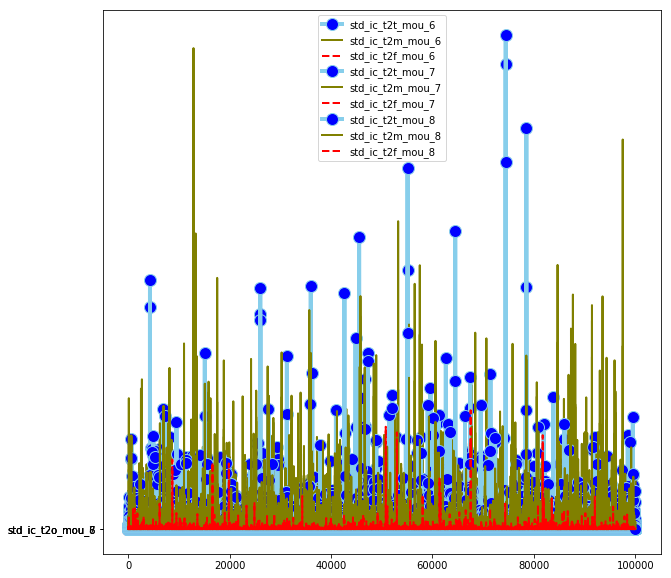

In [126]:
plt.figure(figsize = (10,10))
plt.plot( 'std_ic_t2t_mou_6', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'std_ic_t2m_mou_6', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'std_ic_t2f_mou_6', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.plot( 'std_ic_t2o_mou_6', data=tc_hvc, marker='', color='black', linewidth=2, linestyle='dashed')
plt.legend()
plt.plot( 'std_ic_t2t_mou_7', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'std_ic_t2m_mou_7', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'std_ic_t2f_mou_7', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.plot( 'std_ic_t2o_mou_7', data=tc_hvc, marker='', color='black', linewidth=2, linestyle='dashed')
plt.legend()
plt.plot( 'std_ic_t2t_mou_8', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'std_ic_t2m_mou_8', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'std_ic_t2f_mou_8', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.plot( 'std_ic_t2o_mou_8', data=tc_hvc, marker='', color='black', linewidth=2, linestyle='dashed')
plt.legend()

In [191]:
tc_hvc[['std_ic_mou_6','std_ic_t2t_mou_6','std_ic_t2m_mou_6','std_ic_t2f_mou_6']].corr()

,std_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6
std_ic_mou_6,1.000000,0.687330,0.814191,0.216503
std_ic_t2t_mou_6,0.687330,1.000000,0.160669,0.054072
std_ic_t2m_mou_6,0.814191,0.160669,1.000000,0.065841
std_ic_t2f_mou_6,0.216503,0.054072,0.065841,1.000000


In [192]:
tc_hvc[['std_ic_mou_7','std_ic_t2t_mou_7','std_ic_t2m_mou_7','std_ic_t2f_mou_7']].corr()

,std_ic_mou_7,std_ic_t2t_mou_7,std_ic_t2m_mou_7,std_ic_t2f_mou_7
std_ic_mou_7,1.000000,0.690391,0.819444,0.217647
std_ic_t2t_mou_7,0.690391,1.000000,0.171766,0.055157
std_ic_t2m_mou_7,0.819444,0.171766,1.000000,0.077094
std_ic_t2f_mou_7,0.217647,0.055157,0.077094,1.000000


In [195]:
tc_hvc[['std_ic_mou_8','std_ic_t2t_mou_8','std_ic_t2m_mou_8','std_ic_t2f_mou_8']].corr()

,std_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8
std_ic_mou_8,1.000000,0.658942,0.845787,0.221102
std_ic_t2t_mou_8,0.658942,1.000000,0.181423,0.068743
std_ic_t2m_mou_8,0.845787,0.181423,1.000000,0.056932
std_ic_t2f_mou_8,0.221102,0.068743,0.056932,1.000000


In [213]:
tc_hvc.drop(['std_ic_mou_6','std_ic_mou_7','std_ic_mou_8'],axis=1,inplace=True)

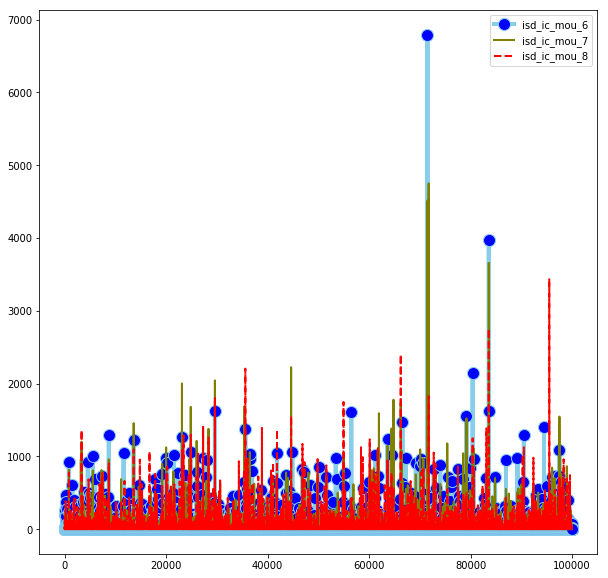

In [131]:
plt.figure(figsize = (10,10))
plt.plot( 'isd_ic_mou_6', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'isd_ic_mou_7', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'isd_ic_mou_8', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.legend()

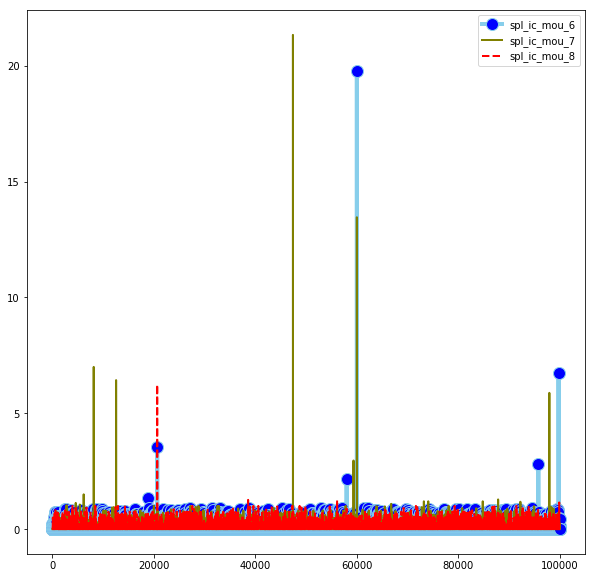

In [132]:
plt.figure(figsize = (10,10))
plt.plot( 'spl_ic_mou_6', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'spl_ic_mou_7', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'spl_ic_mou_8', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.legend()

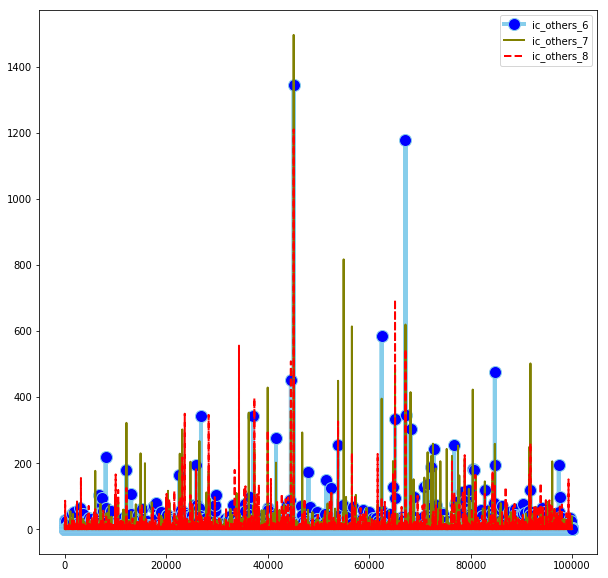

In [133]:
plt.figure(figsize = (10,10))
plt.plot( 'ic_others_6', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'ic_others_7', data=tc_hvc, marker='', color='olive', linewidth=2)
plt.plot( 'ic_others_8', data=tc_hvc, marker='', color='red', linewidth=2, linestyle='dashed')
plt.legend()

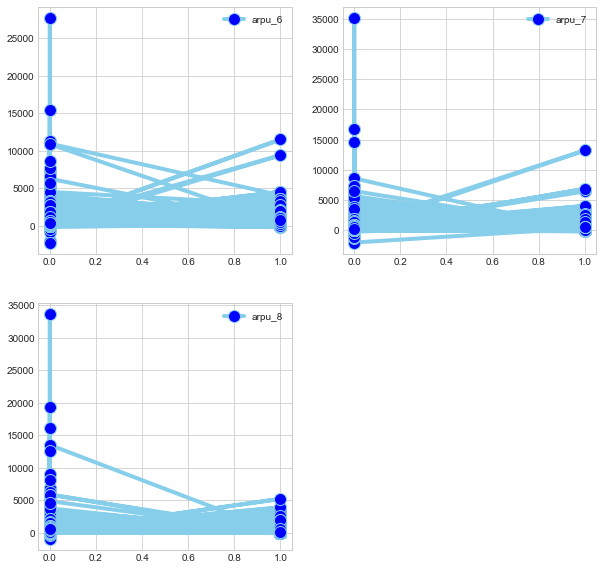

In [209]:
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
plt.plot('churn','arpu_6', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
#plt.show()
plt.legend()
plt.subplot(2,2,2)
plt.plot('churn','arpu_7', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.legend()
#plt.show()
plt.subplot(2,2,3)
plt.plot('churn','arpu_8', data=tc_hvc, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.legend()
plt.show()

# from the graphe can be confirmed that a higher value of arpu, do not churn however nothing can be said about customer with low arpu. 

In [214]:
tc_hvc.describe()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_vocie_data_6,total_rech_vocie_data_7,total_rech_vocie_data_8,average_rech_6_7,churn
count,2.995300e+04,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.00000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000
mean,7.001206e+09,558.820058,561.160547,508.890301,260.900880,268.051744,234.345252,373.800402,378.233106,335.123008,16.124001,12.646145,12.512269,26.596033,20.155134,19.889295,84.574122,85.762835,78.153334,163.309546,163.087606,151.810056,165.897941

In [215]:
tc_hvc.drop(['total_og_mou_6','total_og_mou_7','total_og_mou_8','total_ic_mou_6','total_ic_mou_7','total_ic_mou_8'],axis=1,inplace=True)

In [218]:
# remove columns that were derived to lable churn and non-churn customers
tc_hvc.drop(['average_rech_6_7',],axis=1,inplace=True)
# since now we hava a derived columns total_rech_voice_data_*, droping columns that were used to deireve the new column.
tc_hvc.drop(['total_rech_num_6','total_rech_num_6','total_rech_num_6','av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','total_rech_data_6','total_rech_data_7','total_rech_data_8'],axis=1,inplace=True)

In [220]:
tc_hvc.fb_user_6.describe()

count    29953.000000
mean         0.517845
std          0.499690
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: fb_user_6, dtype: float64

In [232]:
cat_var=list(['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8'])

In [233]:
type(cat_var)

list

In [234]:
tc_hvc[cat_var]=tc_hvc[cat_var].apply(np.int64)

In [235]:
tc_hvc[cat_var]

,night_pck_user_6,night_pck_user_7,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8
0,0,0,0,1,1,1
7,0,0,0,0,0,0
8,0,0,0,0,1,1
21,0,0,0,0,0,0
23,0,0,0,0,1,1
33,1,1,0,1,1,1
38,0,0,0,0,0,0
41,0,0,0,0,0,0
48,0,0,0,0,0,0
53,0,0,0,1,0,0


In [243]:
tc_hvc

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_vocie_data_6,total_rech_vocie_data_7,total_rech_vocie_data_8,churn
0,7000842753,197.385,214.816,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.16,0.00,0.00,4.13,0.00,0.00,1.15,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3,2,362,252,252,252,252,252,6/21/2014,7/16/2014,8/8/2014,252,252,252,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,1,1,1,968,30.40,0.00,101.20,614.00,504.0,504.0,1.0
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,4.30,23.29,12.01,49.89,31.76,49.14,0.00,0.18,10.01,4.50,0.00,6.50,0.00,0.00,0.0,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.21,0.00,0.00,2.06,14.53,31.59,15.74,15.19,15.14,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1580.00,790.0,3638.0,1.0
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,0.00,0.00,10.23,0.00,0.00,0.0,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,21,14,437,601,120,90,154,30,6/25/2014,7/31/2014,8/30/2014,50,0,10,0.0,154.0,23.0,0.0,2.0,3.0,0.0,0.0,0.0,0.00,356.00,0.03,0.00,750.95,11.94,0.00,0.00,19.83,0.00,0.00,0.00,0,0,0,0,1,0,0,1,3,0,0,0,0,0,0,0,1,1,315,21.03,910.65,122.16,437.00,955.0,327.0,0.0
21,7002124215,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,0.00,0.00,4.48,6.16,23.34,91.81,87.93,104.81,97.93,125.94,61.79,665.36,808.74,876.99,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,2.48,10.19,19.54,118.23,74.63,129.16,4.61,2.84,10.39,14.06,5.98,0.18,67.69,38.23,101.74,0.00,0.

In [248]:
tc_hvc['date_of_last_rech_6'].astype(str).apply(lambda x: pd.to_datetime(x, format='%m/%d/%Y'))

ValueError: time data '0' does not match format '%m/%d/%Y' (match)

In [252]:
tc_hvc.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8'],axis=1,inplace=True)

C:\Users\A583452\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


In [236]:
tc_hvc.isnull().sum()/len(tc_hvc.index)

mobile_number              0.0
arpu_6                     0.0
arpu_7                     0.0
arpu_8                     0.0
onnet_mou_6                0.0
onnet_mou_7                0.0
onnet_mou_8                0.0
offnet_mou_6               0.0
offnet_mou_7               0.0
offnet_mou_8               0.0
roam_ic_mou_6              0.0
roam_ic_mou_7              0.0
roam_ic_mou_8              0.0
roam_og_mou_6              0.0
roam_og_mou_7              0.0
roam_og_mou_8              0.0
loc_og_t2t_mou_6           0.0
loc_og_t2t_mou_7           0.0
loc_og_t2t_mou_8           0.0
loc_og_t2m_mou_6           0.0
loc_og_t2m_mou_7           0.0
loc_og_t2m_mou_8           0.0
std_og_t2t_mou_6           0.0
std_og_t2t_mou_7           0.0
std_og_t2t_mou_8           0.0
std_og_t2m_mou_6           0.0
std_og_t2m_mou_7           0.0
std_og_t2m_mou_8           0.0
isd_og_mou_6               0.0
isd_og_mou_7               0.0
isd_og_mou_8               0.0
spl_og_mou_6               0.0
spl_og_m

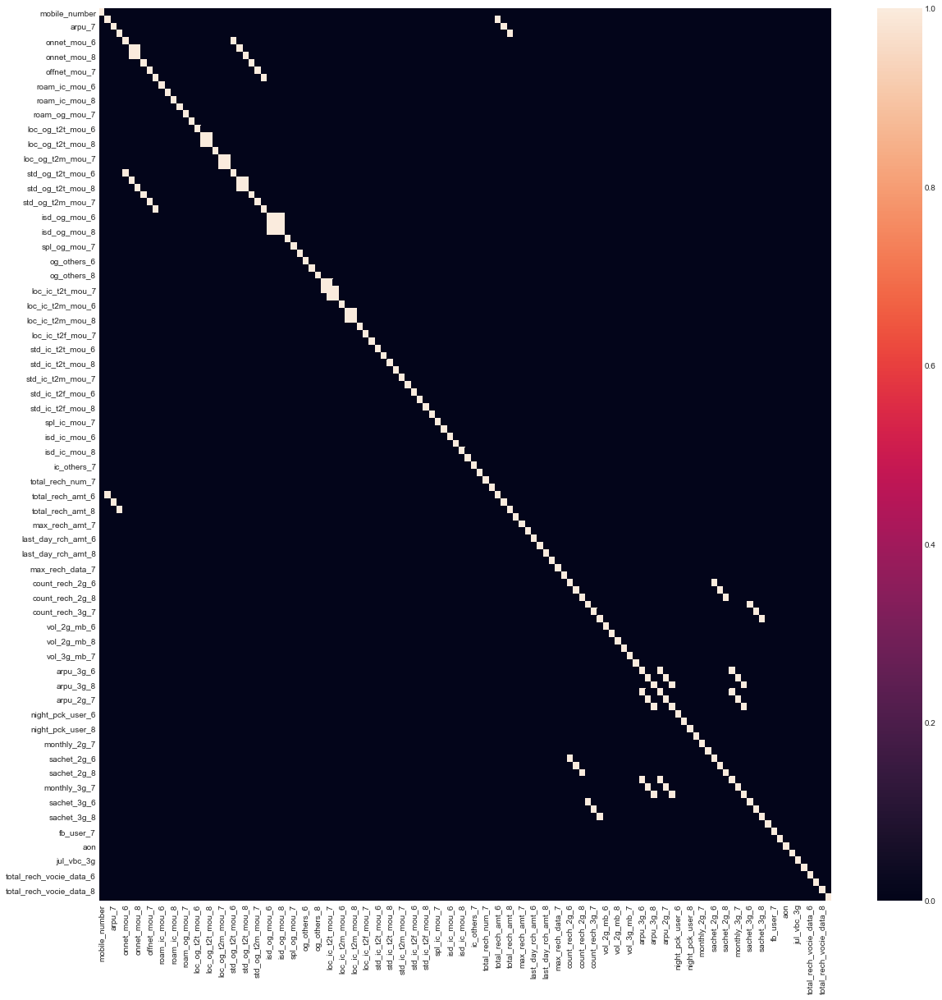

In [239]:
plt.figure(figsize = (20,20)) 
sns.heatmap(tc_hvc.corr()>=.8)


Scaling the dataset

In [253]:
X=tc_hvc.drop('churn',axis=1)

In [254]:
y=tc_hvc.churn

In [255]:
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler


scaler = preprocessing.StandardScaler().fit(X)

Xscaled = scaler.transform(X)

C:\Users\A583452\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\A583452\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:7: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  import sys


In [256]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(Xscaled,y, train_size=0.7,random_state=100)

C:\Users\A583452\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [257]:
print(X_train.shape)
print(X_test.shape)

(20967, 121)
(8986, 121)


In [ ]:
X[X.max_rech_data_6.isnull()]

In [258]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(kind = "regular")
X_tr,y_tr = sm.fit_sample(X_train,y_train)
print(X_tr.shape)
print(y_tr.shape)
np.count_nonzero(y_tr)

(38430, 121)
(38430,)


19215

In [259]:
(y_tr != 0).sum()/(y_tr == 0).sum()

1.0

from the above,its celar that now we dont have an imbalaance in hte dataset 

In [260]:
#Improting the PCA module
from sklearn.decomposition import PCA
pca = PCA(random_state=100)

#Doing the PCA on the train data
pca.fit(X_tr)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=100,
  svd_solver='auto', tol=0.0, whiten=False)

In [261]:
df_train_pca = pca.fit_transform(X_tr)
print(df_train_pca.shape)

df_test_pca = pca.transform(X_test)
print(df_test_pca.shape)# Let's run the model using the selected variables
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
logsk = LogisticRegression(C=1e9)
logsk.fit(df_train_pca, y_tr)

# Predicted probabilities
y_pred = logsk.predict(df_test_pca)
# Converting y_pred to a dataframe which is an array
y_pred_df = pd.DataFrame(y_pred)

(38430, 121)
(8986, 121)


C:\Users\A583452\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


In [262]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Printing confusion matrix
print(confusion_matrix(y_test,y_pred))

[[6799 1506]
 [ 113  568]]


In [264]:
print("LogisticRegression accuracy with PCA: ",accuracy_score(y_test,y_pred))

LogisticRegression accuracy with PCA:  0.8198308479857557


In [265]:
pca.components_

array([[ 1.07929822e-03, -1.42455521e-02,  1.51384679e-02, ...,
         1.03582627e-01,  1.13179242e-01,  1.05622129e-01],
       [ 2.77329088e-02,  2.31608566e-01,  2.50741526e-01, ...,
         4.64753078e-02,  5.94683347e-02,  7.26228070e-02],
       [-8.85038662e-03, -1.30281553e-02, -7.71328648e-02, ...,
        -1.38614691e-02, -6.32403998e-02, -6.55403743e-02],
       ...,
       [ 0.00000000e+00, -5.84667112e-16, -1.85845124e-16, ...,
         2.47150016e-16,  7.79694457e-17, -5.92678676e-18],
       [-0.00000000e+00, -4.27179240e-16, -1.26288392e-16, ...,
         7.41158332e-17,  3.51511716e-16, -5.13273175e-17],
       [-0.00000000e+00,  4.43677198e-16, -6.06511631e-17, ...,
        -1.80829480e-16,  2.06476297e-16, -2.99429070e-16]])

In [266]:
colnames = list(X.columns)
pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'PC3':pca.components_[2],'Feature':colnames})
pcs_df

,PC1,PC2,PC3,Feature
0,0.001079,0.027733,-0.008850,mobile_number
1,-0.014246,0.231609,-0.013028,arpu_6
2,0.015138,0.250742,-0.077133,arpu_7
3,0.052204,0.222936,-0.086062,arpu_8
4,-0.107484,0.109001,-0.049014,onnet_mou_6
5,-0.087594,0.116754,-0.077893,onnet_mou_7
6,-0.043811,0.103823,-0.074085,onnet_mou_8
7,-0.108356,0.189418,-0.099652,offnet_mou_6
8,-0.084079,0.196002,-0.126820,offnet_mou_7
9,-0.028083,0.161116,-0.107695,offnet_mou_8


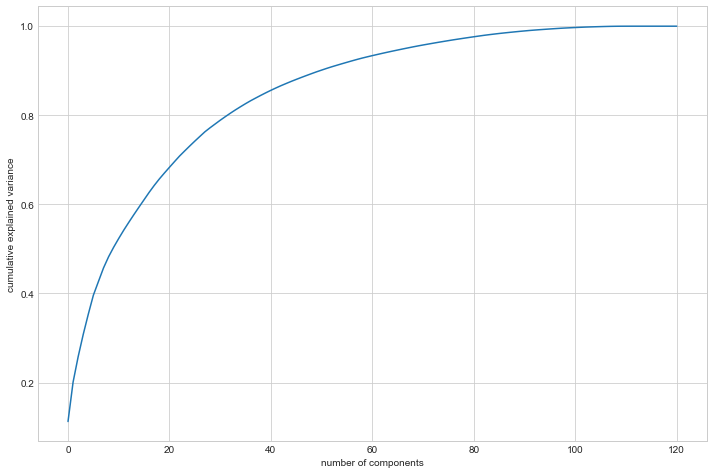

In [277]:
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
#axes = plt.gca()
#axes.set_xlim([0,120])
#axes.set_ylim([0,1])
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [268]:

np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100)

array([ 11.25,  20.1 ,  25.81,  30.81,  35.36,  39.62,  42.7 ,  45.74,
        48.25,  50.39,  52.36,  54.24,  56.01,  57.73,  59.41,  61.06,
        62.71,  64.26,  65.7 ,  67.03,  68.32,  69.6 ,  70.86,  71.99,
        73.11,  74.2 ,  75.26,  76.31,  77.2 ,  78.04,  78.88,  79.68,
        80.46,  81.21,  81.92,  82.61,  83.27,  83.88,  84.48,  85.06,
        85.62,  86.15,  86.66,  87.14,  87.61,  88.06,  88.5 ,  88.93,
        89.35,  89.76,  90.15,  90.53,  90.89,  91.23,  91.57,  91.9 ,
        92.23,  92.55,  92.85,  93.13,  93.4 ,  93.66,  93.92,  94.17,
        94.42,  94.66,  94.9 ,  95.13,  95.36,  95.58,  95.79,  95.99,
        96.19,  96.39,  96.58,  96.77,  96.96,  97.13,  97.3 ,  97.47,
        97.64,  97.8 ,  97.96,  98.1 ,  98.24,  98.37,  98.49,  98.61,
        98.72,  98.83,  98.94,  99.04,  99.13,  99.22,  99.3 ,  99.38,
        99.46,  99.53,  99.59,  99.65,  99.71,  99.76,  99.81,  99.85,
        99.89,  99.92,  99.95,  99.98, 100.  , 100.01, 100.01, 100.01,
      

In [290]:
pca45 = PCA(n_components=60)

In [291]:
df_train_pca45 = pca45.fit_transform(X_tr)
print(df_train_pca45.shape)
df_test_pca45 = pca45.transform(X_test)
print(df_test_pca45.shape)

(38430, 60)
(8986, 60)


In [286]:
df_train_pca45

array([[-2.59468875e+00,  4.64433651e+00,  7.20667584e+00, ...,
        -2.17733458e-01,  1.04062327e+00, -6.45973667e-01],
       [-2.49325987e+00, -8.72662624e-01, -7.65689643e-02, ...,
         7.55577564e-02,  4.83184360e-01, -2.20406726e-02],
       [ 2.47423522e-01, -4.93079824e+00, -4.13218251e-01, ...,
         1.53821200e-01,  3.59170791e-01,  3.90679792e-01],
       ...,
       [-2.54109567e+00, -6.96605104e-01, -5.47605907e-03, ...,
        -1.26781403e-02,  4.61941745e-01, -2.84890590e-01],
       [ 3.97469783e-01, -4.14233565e+00,  9.89107629e-01, ...,
         1.28251484e-02,  2.85629629e-01,  4.63188980e-01],
       [ 1.66005070e+00, -2.81599655e+00,  1.25729964e+00, ...,
         2.22318553e-01,  4.34476354e-01,  7.93097121e-01]])

In [292]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
logsk1 = LogisticRegression(C=1e9)
logsk1.fit(df_train_pca45, y_tr)

# Predicted probabilities
y_pred45 = logsk1.predict(df_test_pca45)
# Converting y_pred to a dataframe which is an array
y_pred_df = pd.DataFrame(y_pred45)

C:\Users\A583452\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


In [293]:
print(confusion_matrix(y_test,y_pred45))

[[6781 1524]
 [ 115  566]]


In [294]:
print("LogisticRegression accuracy with PCA: ",accuracy_score(y_test,y_pred45))

LogisticRegression accuracy with PCA:  0.8176051635878032


In [296]:
X.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_vocie_data_6,total_rech_vocie_data_7,total_rech_vocie_data_8
0,7000842753,197.385,214.816,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.16,0.00,0.00,4.13,0.00,0.00,1.15,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,3,2,362,252,252,252,252,252,252,252,252,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,1,1,1,968,30.40,0.00,101.20,614.0,504.0,504.0
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,4.30,23.29,12.01,49.89,31.76,49.14,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1580.0,790.0,3638.0
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,116.56,133.43,22.58,13.69,10.04,75.69,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0.0,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,21,14,437,601,120,90,154,30,50,0,10,0.0,154.0,23.0,0.0,2.0,3.0,0.0,0.0,0.0,0.00,356.00,0.03,0.00,750.95,11.94,0.00,0.00,19.83,0.00,0.00,0.00,0,0,0,0,1,0,0,1,3,0,0,0,0,0,0,0,1,1,315,21.03,910.65,122.16,437.0,955.0,327.0
21,7002124215,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,0.00,0.00,4.48,6.16,23.34,91.81,87.93,104.81,97.93,125.94,61.79,665.36,808.74,876.99,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,2.48,10.19,19.54,118.23,74.63,129.16,4.61,2.84,10.39,14.06,5.98,0.18,67.69,38.23,101.74,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,26,27,600,680,718,50,50,50,30,20,50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0